<a href="https://colab.research.google.com/github/kmgothman/House-Image/blob/main/kaggle_house_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Using Transfer Learning and TensorFlow 2.0 to Classify Different House Styles**

It can be difficult shopping for a home for many reasons. One reason in particular is that a potential buyer might have a very specific style of home that they are interested in. House listing websites like Zillow classify their homes based on many features but don't include style.

It might be helpful to add a function that filters homes based on the exterior style of the home. This would be done with a computer vision classification model that classifies homes into a few different categories.

The data is grouped into three types; farmhouse, modern, and rustic. There are many more different types of house types but to simplify things I just chose three styles that are common yet distinct from each other. Training on this dataset doesn't account for the fact that many homes are a combination of a few styles.
Also I scraped the data from Google Images which had fewer modern and rustic homes than farmhouse homes

We're going to go through the following TensorFlow/Deep Learning workflow:

1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model (TensorFlow Hub, tf.keras applications, TensorBoard, EarlyStopping).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
6. Save, sharing and reloading your model (once you're happy with the results).

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub.

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
import shutil

In [ ]:
%cd /content

/content


In [ ]:
%mkdir all_images

Upload the images into the all_images directory

In [ ]:
labels = pd.read_csv('labels.csv',index_col='file_label')
labels

,house_type
file_label,
005_dbecd9c4.jpg,farmhouse
003_cfd2b5f1.jpg,farmhouse
004_7a46c013.jpg,farmhouse
001_d2c7428a.jpg,farmhouse
002_5ef9df19.jpg,farmhouse
...,...
254_1355cae0.jpg,rustic
270_b478d734.jpg,rustic
284_404c75b4.jpg,rustic


In [ ]:
labels['house_type'].value_counts()

farmhouse    428
modern       289
rustic       150
Name: house_type, dtype: int64

In [ ]:
len(labels)

867

In [ ]:
import numpy as np

We will create an array for the house type labels that we can convert into boolean

In [ ]:
%cd /content/all_images

count = 0
dir = os.listdir()
dir.sort()
house_type_labels = pd.DataFrame(columns=['house_type'])
for file in dir:
  type=labels.loc[file]['house_type']
  house_type_labels = house_type_labels.append({'house_type':type},ignore_index=True)

/content/all_images


In [ ]:
unique_house_type=np.unique(house_type_labels)
unique_house_type

array(['farmhouse', 'modern', 'rustic'], dtype=object)

In [ ]:
np_labels = house_type_labels.to_numpy()
bool_label = [label == np.array(unique_house_type) for label in np_labels]

In [ ]:
len(house_type_labels)

867

In [ ]:
len(bool_label)

867

In [ ]:
print(bool_label[3].astype(int))

[0 0 1]


Create a list of the file names for our images

In [ ]:
%cd /content/all_images/
filename=list()
dir=os.listdir()
dir.sort()
for file in dir:
  filename.append('/content/all_images/'+str(file))
filename[:2]

/content/all_images


['/content/all_images/001_beaee5fe.jpg',
 '/content/all_images/001_d2c7428a.jpg']

In [ ]:
len(filename)

867

In [ ]:
x=filename
y=bool_label

In [ ]:
#set the number of images for experiment
NUM_IMAGES = 368 #@param {type:'slider',min:200,max:2337,step:2}

In [ ]:
import matplotlib.pyplot as plt
#create a function to make sure images match labels
def my25(images,labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    img = plt.imread(images[i])
    plt.imshow(img)

    plt.title(unique_house_type[y[i].argmax()])

    plt.axis('off')



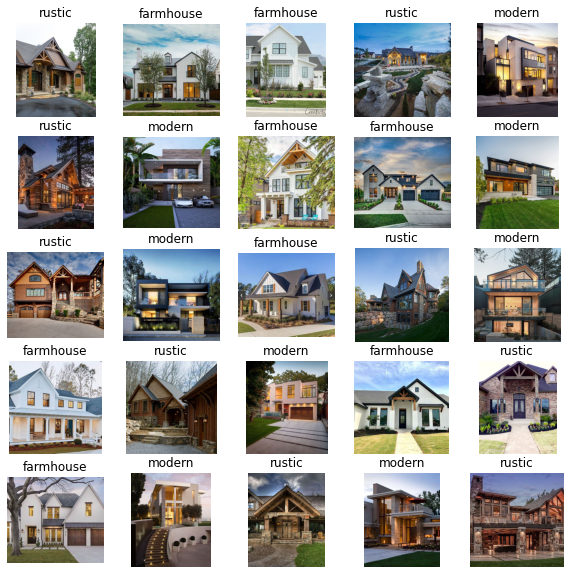

In [ ]:
my25(x,y)

In [ ]:
from sklearn.model_selection import train_test_split
#split the data...

x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(294, 74, 294, 74)

In [ ]:
x_train[:2]

['/content/all_images/154_5d6e91c2.jpg',
 '/content/all_images/134_d4b8c73f.jpg']

In [ ]:
from IPython.display import Image

[False  True False]


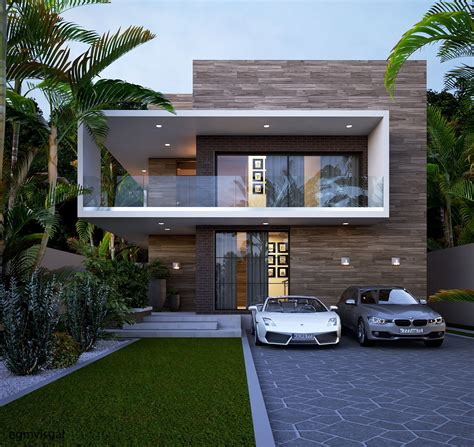

In [ ]:
#checking to make sure our images are working
print(y_train[60])
Image(x_train[60])

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
image = imread(x[1])
image

array([[[140, 171, 192],
        [133, 165, 186],
        [131, 163, 184],
        ...,
        [204, 214, 216],
        [210, 220, 222],
        [210, 220, 222]],

       [[133, 165, 188],
        [133, 165, 188],
        [131, 166, 186],
        ...,
        [200, 210, 212],
        [206, 216, 218],
        [206, 216, 218]],

       [[122, 158, 180],
        [126, 162, 184],
        [128, 164, 186],
        ...,
        [195, 205, 207],
        [202, 212, 214],
        [202, 212, 214]],

       ...,

       [[ 60,  69,  24],
        [ 58,  67,  20],
        [ 57,  66,  19],
        ...,
        [ 73,  69,  21],
        [ 74,  70,  23],
        [ 74,  70,  23]],

       [[105, 114,  69],
        [ 83,  92,  45],
        [ 75,  84,  37],
        ...,
        [ 70,  66,  19],
        [ 90,  86,  39],
        [ 90,  86,  41]],

       [[116, 125,  80],
        [ 81,  90,  43],
        [ 70,  79,  32],
        ...,
        [ 81,  77,  30],
        [ 91,  87,  42],
        [ 91,  87,  42]]

In [ ]:
IMG_SIZE=224

In [ ]:
def process_image(image_path):
  """
  takes an image filepath and turns it into a tensor
  """

   # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image


In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    # data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 3), dtype=tf.bool, name=None)))

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())


In [ ]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_house_type[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

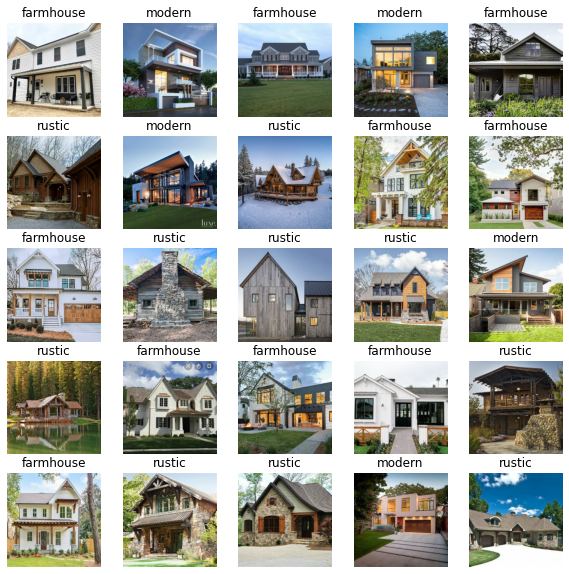

In [ ]:
show_25_images(train_images,train_labels)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_house_type) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 3)                 3006      
                                                                 
Total params: 5,435,719
Trainable params: 3,006
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

In [ ]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("content/gdrive/MyDrive/Colab Notebooks/house_types/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
10/10 [==============================] - 14s 237ms/step - loss: 1.5223 - accuracy: 0.3980 - val_loss: 1.0300 - val_accuracy: 0.5405
Epoch 2/100
10/10 [==============================] - 1s 94ms/step - loss: 0.6754 - accuracy: 0.7347 - val_loss: 0.3830 - val_accuracy: 0.8243
Epoch 3/100
10/10 [==============================] - 1s 104ms/step - loss: 0.3421 - accuracy: 0.8741 - val_loss: 0.2841 - val_accuracy: 0.8919
Epoch 4/100
10/10 [==============================] - 1s 95ms/step - loss: 0.2325 - accuracy: 0.9082 - val_loss: 0.2396 - val_accuracy: 0.9054
Epoch 5/100
10/10 [==============================] - 1s 103ms/step - loss: 0.1866 - accuracy: 0.9252 - val_loss: 0.2013 - val_accuracy: 0.9189
Epoch 6/100
10/10 [==============================] - 2s 151ms/step - loss: 0.1526 - accuracy: 0.9422 - val_loss: 0.1860 - val_accuracy: 0.9189
Epoch 7/100
10/10 [==============================]

In [ ]:
%tensorboard --logdir content/gdrive/MyDrive/Colab\ Notebooks/house_types/logs

<IPython.core.display.Javascript object>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

3/3 [==============================] - 1s 63ms/step


array([[1.56065158e-03, 9.98412251e-01, 2.70327000e-05],
       [5.63561078e-03, 9.92771804e-01, 1.59258174e-03],
       [9.98899221e-01, 1.89286962e-04, 9.11436044e-04],
       [2.91924141e-02, 5.67201301e-02, 9.14087474e-01],
       [9.93852615e-01, 5.76753868e-03, 3.79807752e-04],
       [9.32346331e-04, 9.99027610e-01, 4.00027893e-05],
       [2.32563451e-01, 1.73660517e-01, 5.93776047e-01],
       [9.99708474e-01, 2.02726209e-04, 8.88020077e-05],
       [2.21465132e-03, 2.02801399e-04, 9.97582555e-01],
       [8.88806224e-01, 1.84443325e-03, 1.09349318e-01],
       [5.62981702e-03, 2.78066436e-05, 9.94342327e-01],
       [5.62601583e-03, 8.69441032e-03, 9.85679567e-01],
       [8.42541635e-01, 1.19086541e-01, 3.83717977e-02],
       [9.99003351e-01, 9.80338780e-04, 1.62819233e-05],
       [1.66586787e-02, 2.20980437e-04, 9.83120322e-01],
       [3.39496344e-01, 3.91458394e-03, 6.56589031e-01],
       [1.92881636e-02, 2.13489591e-04, 9.80498314e-01],
       [8.37817371e-01, 1.02352

In [ ]:
# Check the shape of predictions
predictions.shape

(74, 3)

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_house_type[np.argmax(predictions[0])]}") # the predicted label

[1.5606516e-03 9.9841225e-01 2.7032700e-05]
Max value (probability of prediction): 0.9984122514724731
Sum: 0.9999999403953552
Max index: 1
Predicted label: modern


In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_house_type[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'modern'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_house_type[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.5215158 , 0.6548491 , 0.9372021 ],
         [0.50777406, 0.6411074 , 0.92346036],
         [0.51845396, 0.6517873 , 0.93414026],
         ...,
         [0.67633057, 0.7665267 , 0.97044826],
         [0.67633057, 0.7665267 , 0.97044826],
         [0.69684875, 0.7870449 , 0.99096644]],
 
        [[0.5150035 , 0.6483368 , 0.9306898 ],
         [0.49931726, 0.63265055, 0.91500354],
         [0.50386906, 0.6372024 , 0.91955537],
         ...,
         [0.65609246, 0.74628854, 0.95021015],
         [0.65609246, 0.74628854, 0.95021015],
         [0.6784314 , 0.7686275 , 0.9725491 ]],
 
        [[0.5222164 , 0.6555497 , 0.9379027 ],
         [0.50260854, 0.63594186, 0.91829485],
         [0.50182855, 0.6351619 , 0.91751486],
         ...,
         [0.65553224, 0.7457283 , 0.94964993],
         [0.65553224, 0.7457283 , 0.94964993],
         [0.67577034, 0.7659665 , 0.96988803]],
 
        ...,
 
        [[0.0784812 , 0.09808904, 0.18436354],
         [0.07823576, 0.10176518, 0.18930

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

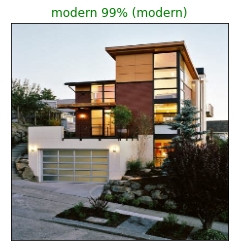

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_house_type[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

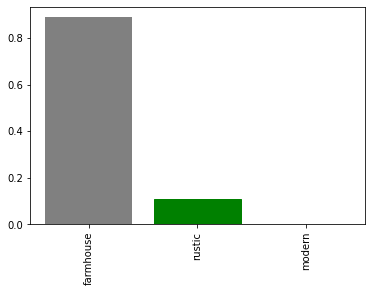

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

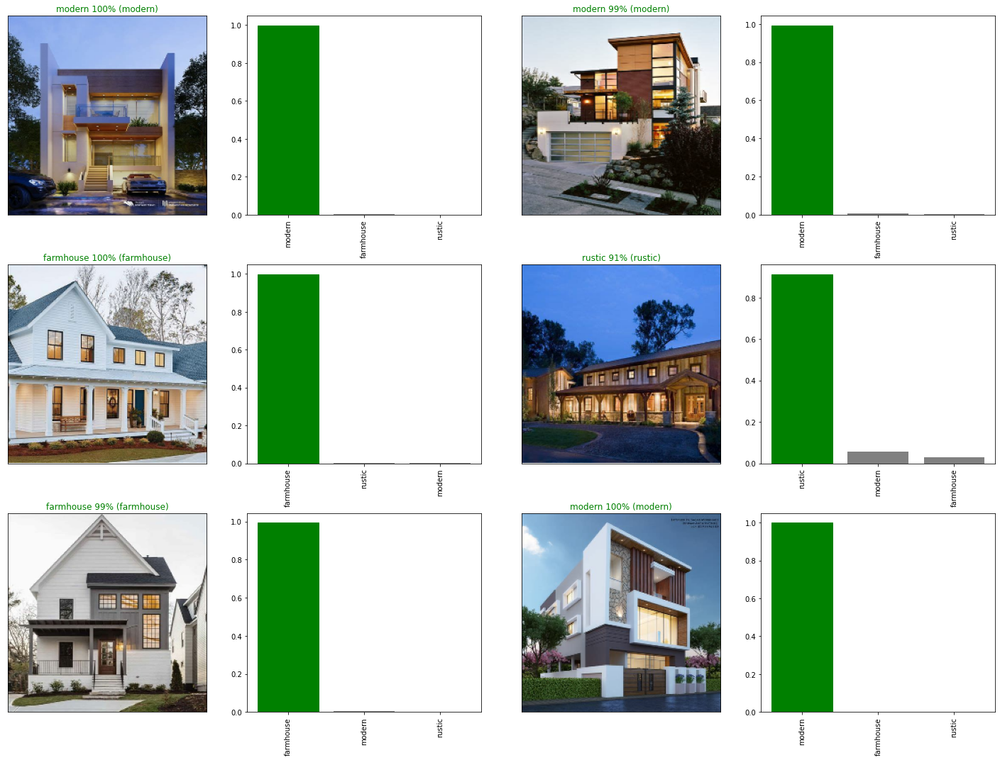

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
%cd /content

/content


In [ ]:
%mkdir test

In [ ]:
# Get custom image filepaths
custom_path = "/content/test/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths.pop(4)

'/content/test/.ipynb_checkpoints'

In [ ]:
custom_image_paths

['/content/test/18859d67e7cb86f1932fcb1cf1dd4560-cc_ft_576.jpg',
 '/content/test/modern-architectural-style-with-warm-finishes-to-compliment-mountain-setting.jpeg',
 '/content/test/49ceb169e84c79e25e739511ac50086e-cc_ft_1536.jpg',
 '/content/test/3bb9a932d5be7a1797ff8f0126fb6b1c-cc_ft_1536.jpg',
 '/content/test/image2.jpeg',
 '/content/test/3e45c90627ec858b8920eec5cbb86356-cc_ft_1536.jpg']

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = model.predict(custom_data)

1/1 [==============================] - 0s 83ms/step


In [ ]:
custom_preds.shape

(6, 3)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['farmhouse', 'modern', 'farmhouse', 'rustic', 'rustic', 'modern']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

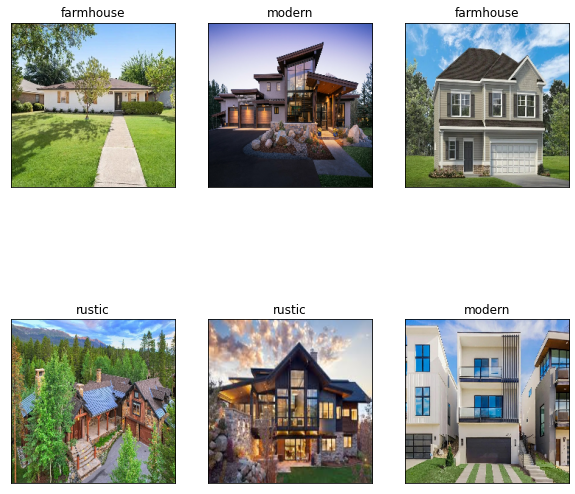

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
custom_val_labels = ['none','farm','farm','modern','modern','rustic']

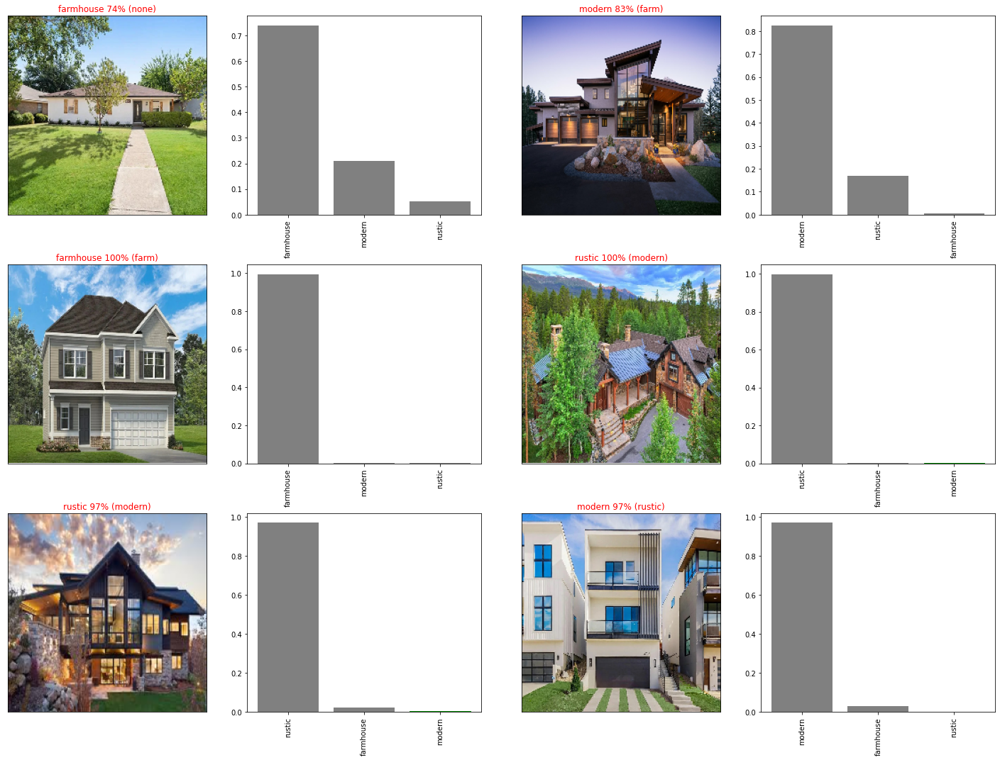

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=custom_preds,
            labels=custom_val_labels,
            images=custom_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=custom_preds,
                labels=custom_val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%cd ~

/root


In [ ]:
os.listdir()

['.profile',
 '.bashrc',
 '.ipython',
 '.config',
 '.nv',
 '.local',
 '.tmux.conf',
 '.wget-hsts',
 '.cache',
 '.npm',
 '.jupyter',
 '.keras']

In [ ]:
%cd /root/.local/

/root/.local


In [ ]:
os.listdir()

['share']

In [ ]:
%mkdir bin

In [ ]:
%cd /root/.local/bin

/root/.local/bin


In [ ]:
shutil.move('/content/kaggle.json','/root/.local/bin/kaggle.json')

'/root/.local/bin/kaggle.json'